In [18]:
# installing library for extracting files
!pip install pyunpack

In [19]:
# import required libraries
import os
import patoolib
import pickle
import random
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf

from pyunpack import Archive
from os import path
from sklearn.svm import SVC
from skimage.feature import hog
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score
from skimage.transform import resize
from tensorflow.keras.preprocessing import image
from PIL import Image


from PIL import Image, ImageFilter
from PIL.ImageFilter import (BLUR, CONTOUR, DETAIL, EDGE_ENHANCE, EDGE_ENHANCE_MORE,EMBOSS, FIND_EDGES, SMOOTH, SMOOTH_MORE, SHARPEN)

%matplotlib inline

In [20]:
# extracting the files
Archive("17flowers.rar").extractall(".")

# Analysing Dataset

In [21]:
# checking the directory 
flowers_dir = "17flowers"

In [22]:
# checking the list in the directory
os.listdir(flowers_dir)

['17flowers.pkl', '17flowers.tgz', 'jpg']

In [23]:
# setting the flower folder path
files = os.listdir(flowers_dir)
files

['17flowers.pkl', '17flowers.tgz', 'jpg']

In [25]:
# checking the categories of the flower
flowers_path = flowers_dir+ '/jpg'
flowers = os.listdir(flowers_path)

flowers_data = []

for flw in flowers:
  if(flw.isnumeric()):
    flowers_data.append(flw)

print(flowers_data)

['0', '1', '10', '11', '12', '13', '14', '15', '16', '2', '3', '4', '5', '6', '7', '8', '9']


In [26]:
# checking the number of images for each cateogry
total_flower_images = 0

for i in flowers_data:
  print("No. of images for category " + i + " : " + str(len(os.listdir(flowers_path+ '/'+ i ))))
  total_flower_images += len(os.listdir(flowers_path+ '/'+ i ))
print("Total - " + str(total_flower_images))

No. of images for category 0 : 80
No. of images for category 1 : 80
No. of images for category 10 : 80
No. of images for category 11 : 88
No. of images for category 12 : 82
No. of images for category 13 : 85
No. of images for category 14 : 80
No. of images for category 15 : 80
No. of images for category 16 : 80
No. of images for category 2 : 80
No. of images for category 3 : 80
No. of images for category 4 : 80
No. of images for category 5 : 80
No. of images for category 6 : 80
No. of images for category 7 : 80
No. of images for category 8 : 80
No. of images for category 9 : 80
Total - 1375


In [27]:
# Checking the mean average for each flower class
for flower_type in flowers_data:
  dim1 = []
  dim2 = []
  print("Category - ", flower_type)
  for image_filename in os.listdir(flowers_path+'/'+flower_type):
    img = plt.imread(flowers_path+'/'+flower_type+'/'+image_filename)
    d1,d2,colors = img.shape
    dim1.append(d1)
    dim2.append(d2)
  print(np.mean(dim1), ' * ', np.mean(dim2))

Category -  0
540.925  *  603.55
Category -  1
562.7625  *  586.6375
Category -  10
520.325  *  617.8125
Category -  11
536.8295454545455  *  603.0681818181819
Category -  12
513.560975609756  *  620.0365853658536
Category -  13
573.9882352941177  *  579.9411764705883
Category -  14
519.15  *  588.3
Category -  15
527.5  *  593.175
Category -  16
579.3125  *  542.4875
Category -  2
611.4875  *  559.9625
Category -  3
591.8125  *  579.9875
Category -  4
549.3625  *  611.275
Category -  5
541.35  *  527.9125
Category -  6
564.175  *  601.525
Category -  7
610.0625  *  568.7375
Category -  8
572.8125  *  548.0
Category -  9
531.0125  *  585.6375


In [28]:
# dataframe for the flowers dataset
train_data = []
for category_id, category in enumerate(flowers_data):
    for file in os.listdir(os.path.join(flowers_path, category)):
        train_data.append(['{}/{}'.format(category, file), category_id, category])
train = pd.DataFrame(train_data, columns=['imagefile', 'category_id', 'category'])

In [30]:
# checking the labels against the flower images
train.sample(25)

,imagefile,category_id,category
1328,9/image_0754.jpg,16,9
942,4/image_0368.jpg,11,4
470,13/image_1096.jpg,5,13
1283,8/image_0709.jpg,15,8
575,15/image_1201.jpg,7,15
698,16/image_1324.jpg,8,16
552,14/image_1178.jpg,6,14
360,12/image_0991.jpg,4,12
1246,8/image_0672.jpg,15,8
1258,8/image_0684.jpg,15,8


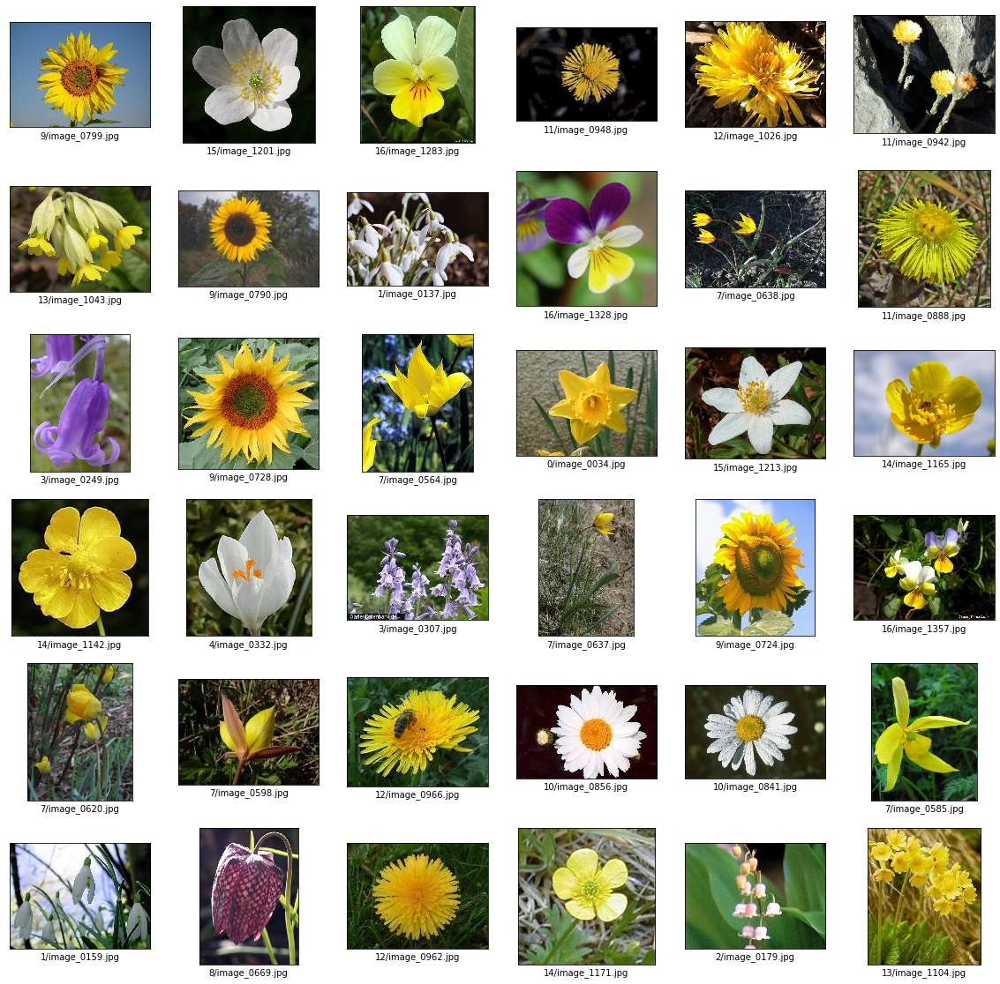

In [31]:
# visualizing few training images vs the labels
plt.figure(figsize=(20,20))
for i in range(36):
  idx = random.randint(0, 1374)
  plt.subplot(6,6,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(plt.imread(flowers_path + '/'+ train['imagefile'][idx]))
  plt.xlabel(train['imagefile'][idx])
plt.show()

In [32]:
# function to apply the filters
def image_filtered(filepath):
  filters = [BLUR, CONTOUR, DETAIL, EDGE_ENHANCE, EDGE_ENHANCE_MORE,
    EMBOSS, FIND_EDGES, SMOOTH, SMOOTH_MORE, SHARPEN]
  for f in filters:
    image = Image.open(filepath)
    image = image.filter(f)
    print("Filter applied - ", f)
    display(image)

FILTER APPLIED FOR FLOWER LABEL  5  AND IMAGE NAME  5/image_0474.jpg
Filter applied -  <class 'PIL.ImageFilter.BLUR'>


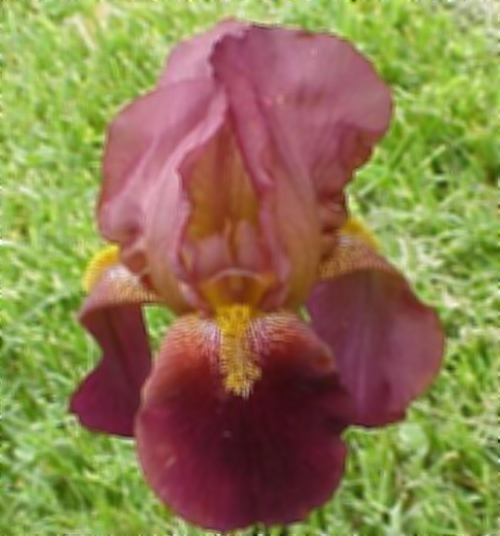

Filter applied -  <class 'PIL.ImageFilter.CONTOUR'>


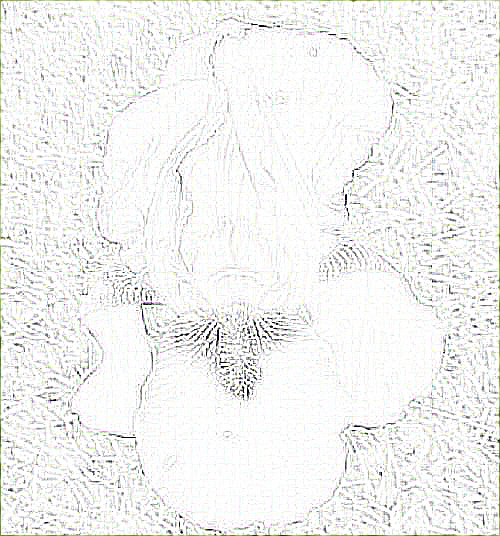

Filter applied -  <class 'PIL.ImageFilter.DETAIL'>


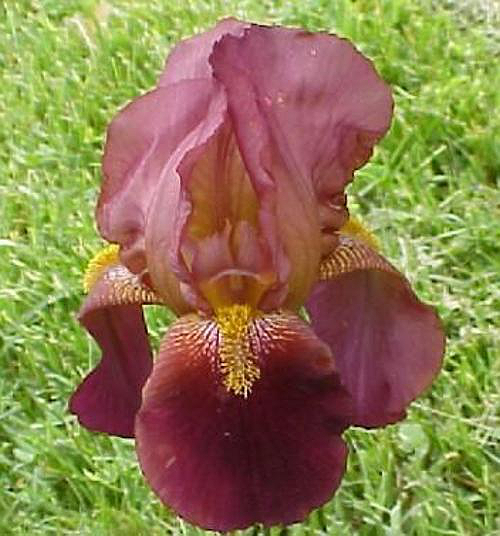

Filter applied -  <class 'PIL.ImageFilter.EDGE_ENHANCE'>


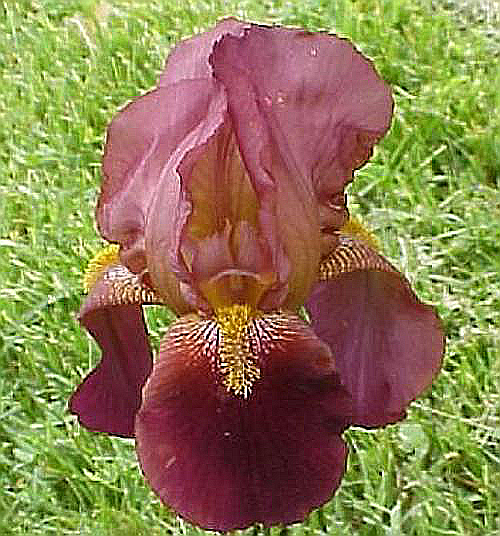

Filter applied -  <class 'PIL.ImageFilter.EDGE_ENHANCE_MORE'>


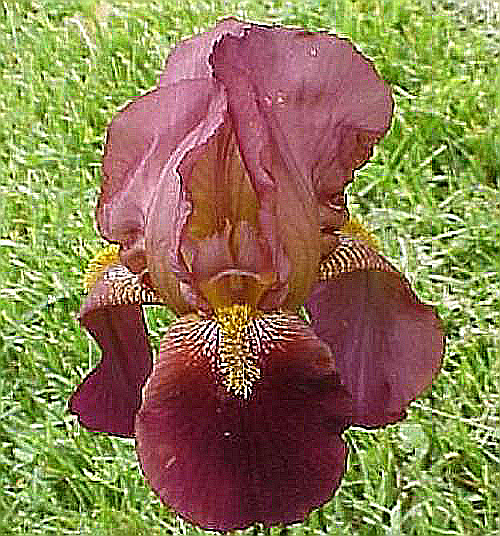

Filter applied -  <class 'PIL.ImageFilter.EMBOSS'>


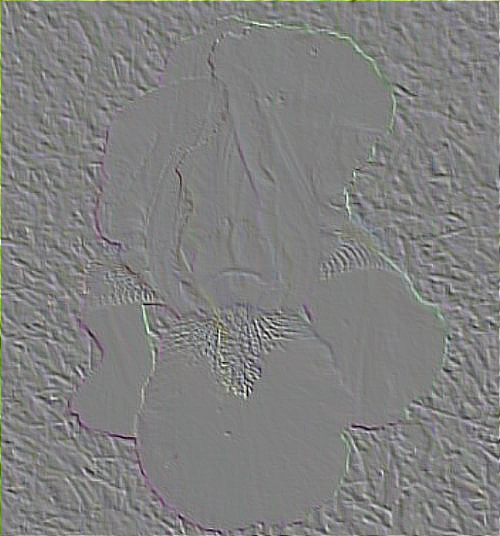

Filter applied -  <class 'PIL.ImageFilter.FIND_EDGES'>


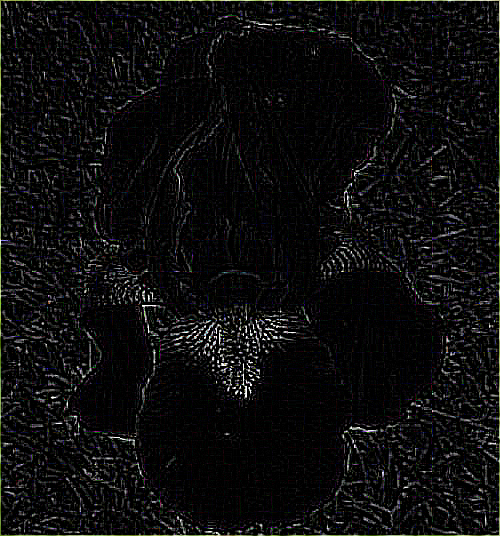

Filter applied -  <class 'PIL.ImageFilter.SMOOTH'>


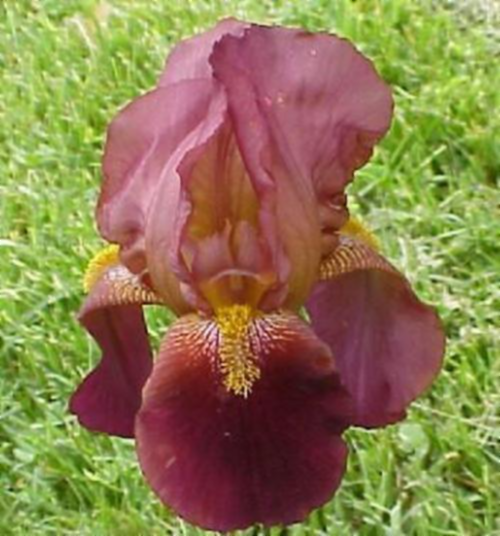

Filter applied -  <class 'PIL.ImageFilter.SMOOTH_MORE'>


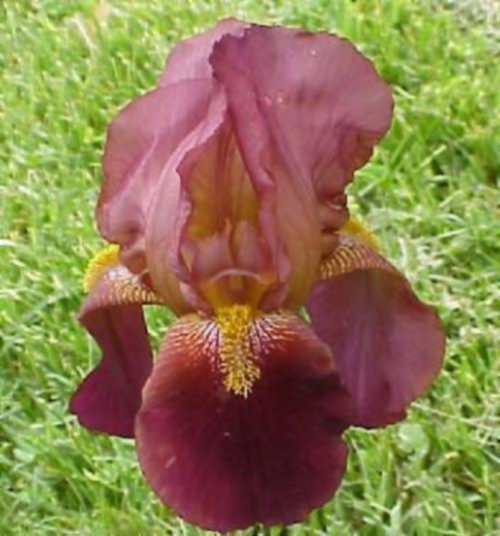

Filter applied -  <class 'PIL.ImageFilter.SHARPEN'>


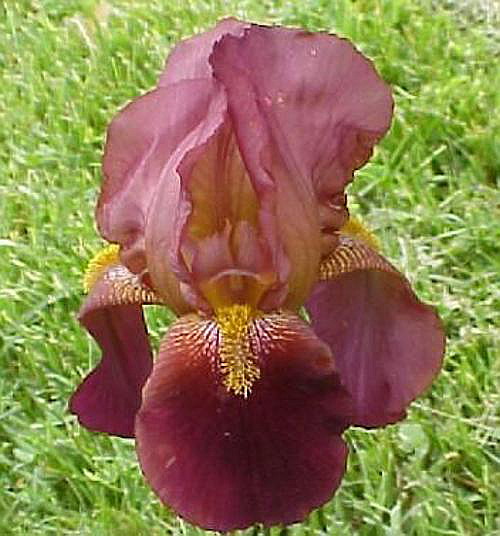

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
FILTER APPLIED FOR FLOWER LABEL  4  AND IMAGE NAME  4/image_0370.jpg
Filter applied -  <class 'PIL.ImageFilter.BLUR'>


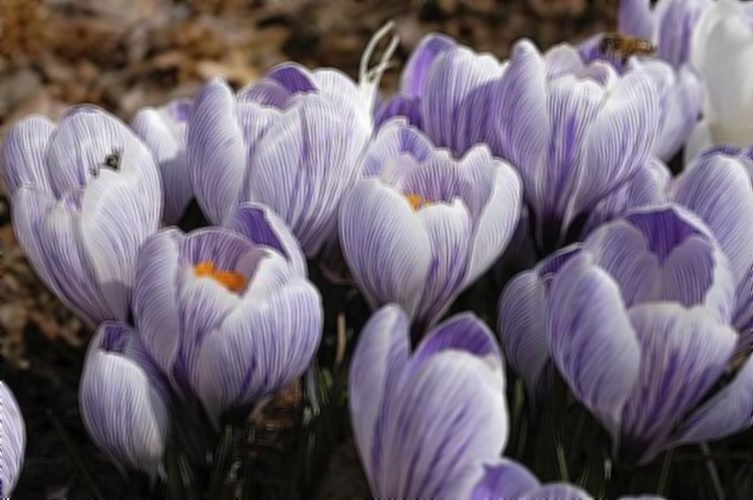

Filter applied -  <class 'PIL.ImageFilter.CONTOUR'>


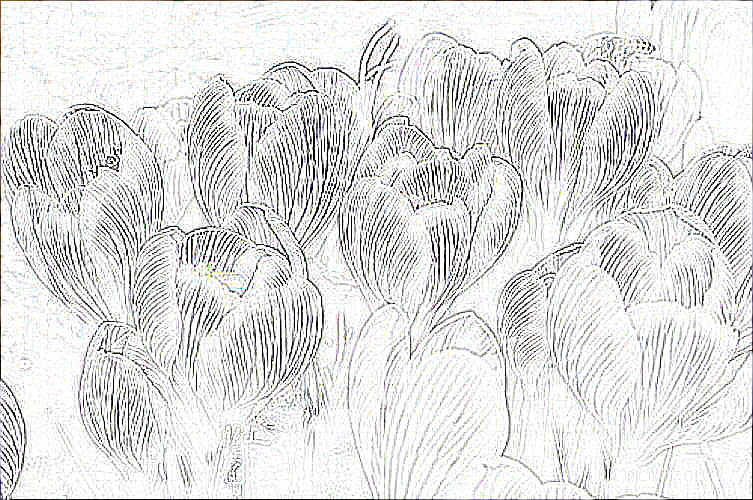

Filter applied -  <class 'PIL.ImageFilter.DETAIL'>


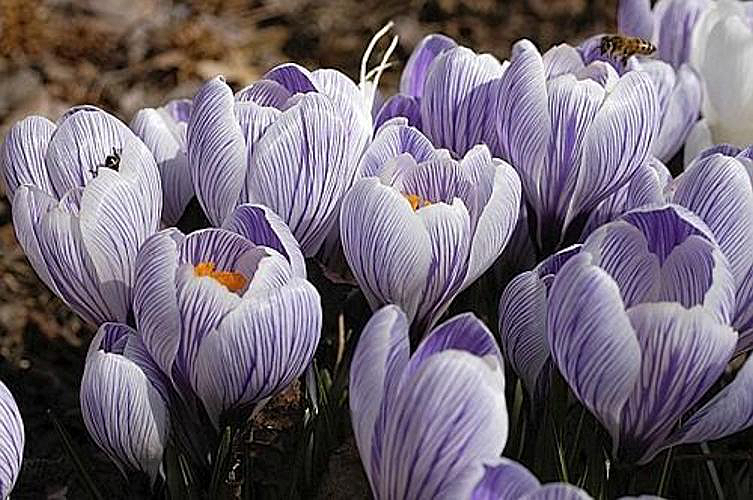

Filter applied -  <class 'PIL.ImageFilter.EDGE_ENHANCE'>


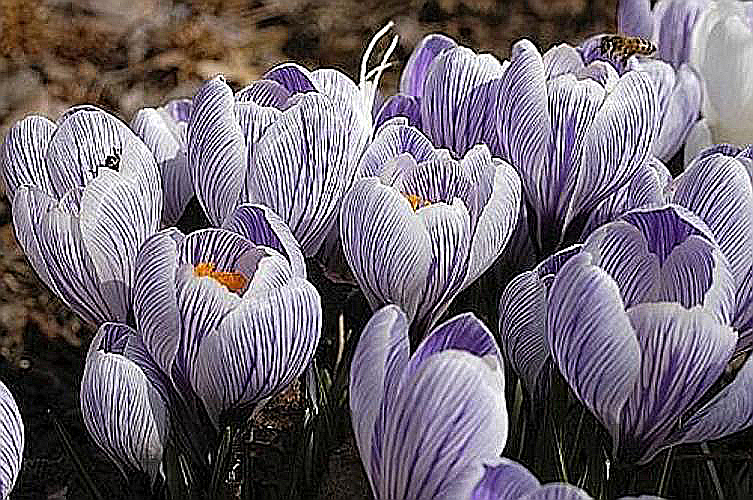

Filter applied -  <class 'PIL.ImageFilter.EDGE_ENHANCE_MORE'>


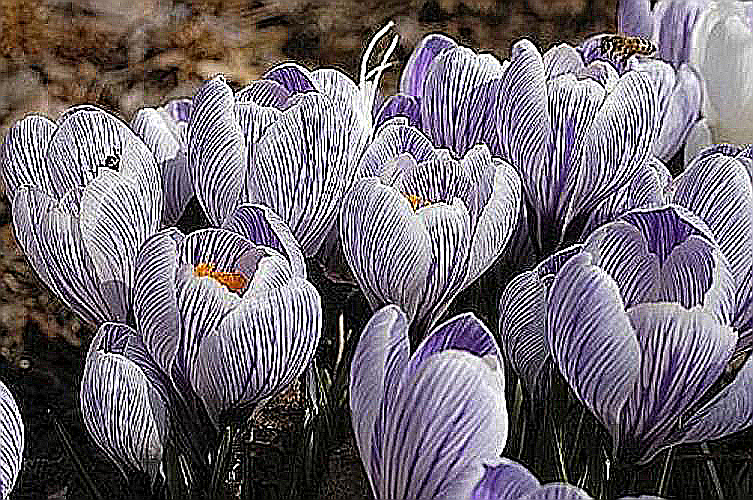

Filter applied -  <class 'PIL.ImageFilter.EMBOSS'>


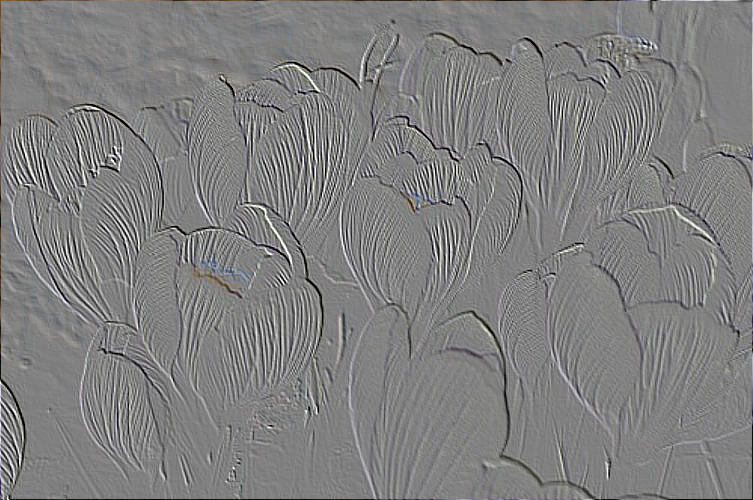

Filter applied -  <class 'PIL.ImageFilter.FIND_EDGES'>


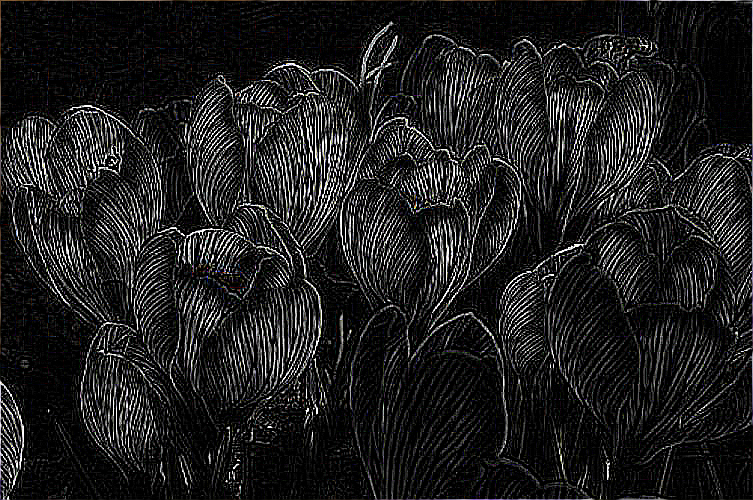

Filter applied -  <class 'PIL.ImageFilter.SMOOTH'>


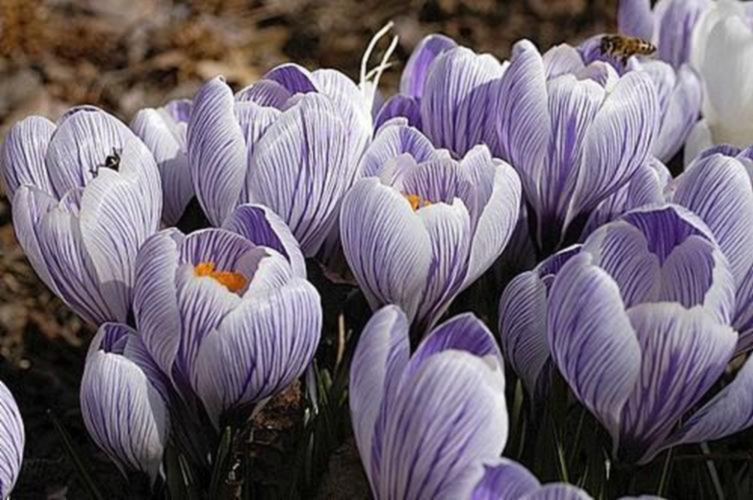

Filter applied -  <class 'PIL.ImageFilter.SMOOTH_MORE'>


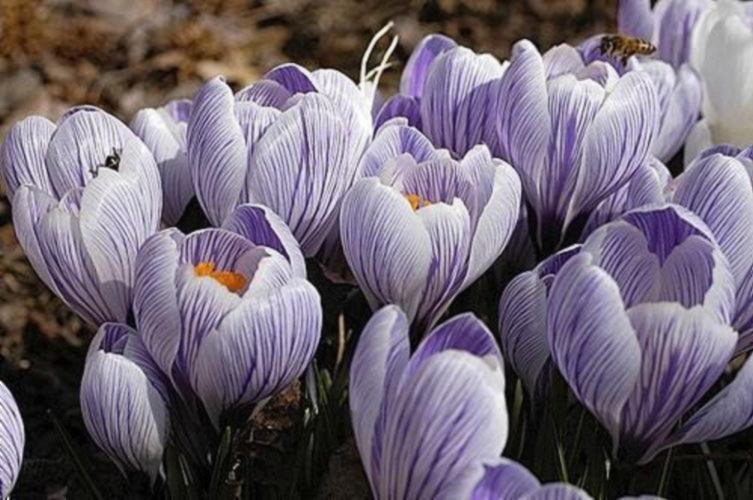

Filter applied -  <class 'PIL.ImageFilter.SHARPEN'>


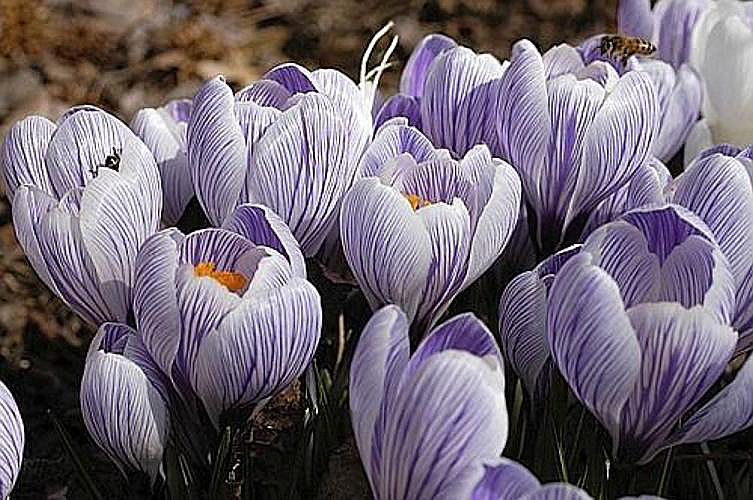

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*


In [33]:
# applying filters to randomly selected 2 images
for i in range(2):
  idx = random.randint(0, 1374)
  print("FILTER APPLIED FOR FLOWER LABEL ",  train['category'][idx] ," AND IMAGE NAME ", train['imagefile'][idx])
  image_filtered(flowers_path + '/'+ train['imagefile'][idx])
  print("*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*")

# Training with SVM

In [34]:
# creating the features from the images
def create_features(img):
    # flatten three channel color image
    color_features = img[...,:3].flatten()
    # convert image to greyscale
    grey_image = np.dot(img[...,:3], [0.299, 0.587, 0.114])
    # get HOG features from greyscale image
    hog_features = hog(grey_image, block_norm='L2-Hys', pixels_per_cell=(16, 16))
    # combine color and hog features into a single array
    flat_features = np.hstack((color_features,hog_features))
    return flat_features

In [35]:
# flattening the image to 1D
flat_data = []
target = []
for ind in train.index:
  path = flowers_path + '/'+   train['imagefile'][ind]
  img = Image.open(path)
  img_resized = img.resize((64,64))
  img_resized_array = np.array(img_resized)
  flat_data.append(create_features(img_resized_array))
  target.append(train['category'][ind])
flat_data = np.array(flat_data)
target = np.array(target)

In [36]:
# dataframe with the resized images array
df_resized_images = pd.DataFrame(flat_data.tolist())

In [37]:
# shape of the dataset
df_resized_images.shape

(1375, 12612)

In [38]:
df_resized_images.sample(5)

,0,1,2,3,4,5,6,7,8,9,...,12602,12603,12604,12605,12606,12607,12608,12609,12610,12611
1322,81.0,90.0,58.0,36.0,65.0,26.0,33.0,68.0,30.0,58.0,...,0.099470,0.062207,0.032916,0.031581,0.028563,0.097511,0.086527,0.069387,0.073153,0.039183
724,34.0,45.0,22.0,38.0,46.0,21.0,41.0,46.0,23.0,39.0,...,0.172198,0.208006,0.129880,0.045529,0.021154,0.034526,0.042966,0.043949,0.119610,0.159866
913,154.0,153.0,133.0,154.0,153.0,133.0,152.0,151.0,131.0,149.0,...,0.069260,0.142369,0.203341,0.127181,0.115414,0.174013,0.117029,0.093926,0.094263,0.082955
497,15.0,18.0,13.0,17.0,21.0,14.0,29.0,39.0,21.0,29.0,...,0.079875,0.075346,0.053119,0.068413,0.056079,0.109869,0.093977,0.122532,0.114588,0.041940
1178,129.0,143.0,114.0,103.0,114.0,99.0,91.0,103.0,89.0,108.0,...,0.054158,0.118958,0.054615,0.143733,0.055080,0.056248,0.039392,0.047039,0.061053,0.096954


In [39]:
# checking for null 
df_resized_images.isna().sum().sum()

0

In [40]:
# normalizing the dataset
sc = StandardScaler()

In [41]:
df_scaled = sc.fit_transform(df_resized_images)

In [42]:
#applying PCA to get the most relevant features 
pca = PCA(n_components=500)

In [43]:
df_pca = pd.DataFrame(pca.fit_transform(df_scaled))

In [44]:
# splitting the dataset to train and test
X = pd.DataFrame(df_pca)
y = target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=7)

In [45]:
# define support vector classifier
svc_model = SVC(C= 10, kernel='linear', gamma= 1, random_state=7, probability=True)

# fit model
svc_model.fit(X_train, y_train)

SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='linear',
    max_iter=-1, probability=True, random_state=7, shrinking=True, tol=0.001,
    verbose=False)

In [47]:
# cross val scores
scores = cross_val_score(svc_model, X_train, y_train, cv=4, scoring='accuracy')
np.mean(scores) 

0.5027272727272727

# Image generator

In [48]:
#setting the image datagenerator model
image_size = 128
batch_size = 32

image_datagenerator = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    validation_split=0.2)

In [49]:
#Build training generator
train_generator = image_datagenerator.flow_from_directory('17flowers/jpg',
                                                    target_size=(image_size, image_size),
                                                    subset='training',
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    shuffle=True,
                                                    seed= 7
                                                )

#Build validation generator
val_generator = image_datagenerator.flow_from_directory('17flowers/jpg',
                                                   target_size=(image_size, image_size),                                                   
                                                   subset='validation',
                                                   batch_size=batch_size,
                                                   class_mode='categorical',
                                                   shuffle=True,
                                                   seed= 7
                                                )

Found 1101 images belonging to 17 classes.
Found 274 images belonging to 17 classes.


In [50]:
#Lets check the features (images) and Labels (plant class) returned by ImageDataGenerator
X, y = next(train_generator)

print('Input features shape', X.shape)
print('Actual labels shape', y.shape)

Input features shape (32, 128, 128, 3)
Actual labels shape (32, 17)


# Training with Neural Networks

In [55]:
#Clear any previous model from memory
tf.keras.backend.clear_session()

#Initialize model
model = tf.keras.models.Sequential()

#flatten the layers
model.add(tf.keras.layers.Flatten(input_shape=(image_size,image_size,3)))
# normalizing the features
model.add(tf.keras.layers.BatchNormalization())

# adding layer
model.add(tf.keras.layers.Dense(200, activation='relu'))
# normalizing the features
model.add(tf.keras.layers.BatchNormalization())

# adding layer
model.add(tf.keras.layers.Dense(100, activation='relu'))
# adding dropout
model.add(tf.keras.layers.Dropout(0.20))

# adding layer
model.add(tf.keras.layers.Dense(100, activation='relu'))
# normalizing the features
model.add(tf.keras.layers.BatchNormalization())

# adding layer
model.add(tf.keras.layers.Dense(50, activation='relu'))
# adding dropout
model.add(tf.keras.layers.Dropout(0.20))

# adding layer
model.add(tf.keras.layers.Dense(30, activation='relu'))
# adding dropout
model.add(tf.keras.layers.Dropout(0.20))

# adding output layer
model.add(tf.keras.layers.Dense(17, activation='softmax'))

In [56]:
#Specify Loss and Optimizer
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

#Model Summary
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 49152)             0         
_________________________________________________________________
batch_normalization (BatchNo (None, 49152)             196608    
_________________________________________________________________
dense (Dense)                (None, 200)               9830600   
_________________________________________________________________
batch_normalization_1 (Batch (None, 200)               800       
_________________________________________________________________
dense_1 (Dense)              (None, 100)               20100     
_________________________________________________________________
dropout (Dropout)            (None, 100)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 100)               1

In [57]:
#Saving the best model using model checkpoint callback
model_checkpoint=tf.keras.callbacks.ModelCheckpoint('flowers_DNN.h5', #where to save the model
                                                    save_best_only=True, 
                                                    monitor='val_acc', 
                                                    mode='max', 
                                                    verbose = 1)

In [58]:
model.fit(train_generator,
                    epochs=50,
                    steps_per_epoch= 1101//batch_size,  #Number of training images//batch_size
                    validation_data=val_generator,
                    validation_steps = 274//batch_size, #Number of test images//batch_size
                    callbacks = [model_checkpoint])

Epoch 1/50
33/34 [============================>.] - ETA: 0s - loss: 2.9113 - acc: 0.0791
Epoch 00001: val_acc improved from -inf to 0.10156, saving model to flowers_DNN.h5
34/34 [==============================] - 10s 301ms/step - loss: 2.9033 - acc: 0.0795 - val_loss: 4.5177 - val_acc: 0.1016
Epoch 2/50
33/34 [============================>.] - ETA: 0s - loss: 2.7059 - acc: 0.1196
Epoch 00002: val_acc did not improve from 0.10156
34/34 [==============================] - 10s 282ms/step - loss: 2.7078 - acc: 0.1188 - val_loss: 3.3072 - val_acc: 0.0898
Epoch 3/50
33/34 [============================>.] - ETA: 0s - loss: 2.6422 - acc: 0.1408
Epoch 00003: val_acc improved from 0.10156 to 0.11719, saving model to flowers_DNN.h5
34/34 [==============================] - 10s 282ms/step - loss: 2.6483 - acc: 0.1403 - val_loss: 2.9068 - val_acc: 0.1172
Epoch 4/50
33/34 [============================>.] - ETA: 0s - loss: 2.5890 - acc: 0.1466
Epoch 00004: val_acc improved from 0.11719 to 0.16406, savi

Epoch 31/50
33/34 [============================>.] - ETA: 0s - loss: 1.9488 - acc: 0.3491
Epoch 00031: val_acc did not improve from 0.40234
34/34 [==============================] - 8s 243ms/step - loss: 1.9587 - acc: 0.3471 - val_loss: 1.7898 - val_acc: 0.3906
Epoch 32/50
33/34 [============================>.] - ETA: 0s - loss: 1.9076 - acc: 0.3462
Epoch 00032: val_acc did not improve from 0.40234
34/34 [==============================] - 8s 247ms/step - loss: 1.9129 - acc: 0.3442 - val_loss: 1.7589 - val_acc: 0.3555
Epoch 33/50
33/34 [============================>.] - ETA: 0s - loss: 1.9051 - acc: 0.3510
Epoch 00033: val_acc did not improve from 0.40234
34/34 [==============================] - 8s 244ms/step - loss: 1.9014 - acc: 0.3536 - val_loss: 1.8550 - val_acc: 0.3438
Epoch 34/50
33/34 [============================>.] - ETA: 0s - loss: 1.8778 - acc: 0.3558
Epoch 00034: val_acc did not improve from 0.40234
34/34 [==============================] - 8s 248ms/step - loss: 1.8766 - acc: 

In [59]:
# loading the model saved with the best acccuracy
model_DNN = tf.keras.models.load_model('flowers_DNN.h5')

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [61]:
_ , acc = model_DNN.evaluate(val_generator, steps=len(val_generator))
print("Accuracy", acc)

9/9 [==============================] - 2s 195ms/step - loss: 1.6285 - acc: 0.4453
Accuracy 0.4452555


# Training with Convolution Neural Networks

In [62]:
#Clear any previous model from memory
tf.keras.backend.clear_session()

#Initialize model
model = tf.keras.models.Sequential()

#Add Conv Layer
model.add(tf.keras.layers.Conv2D(32, kernel_size=(3, 3), input_shape=(image_size, image_size, 3), activation='relu'))

#Add Conv Layer
model.add(tf.keras.layers.Conv2D(32, kernel_size=(3,3), activation='relu'))

#normalize data
model.add(tf.keras.layers.BatchNormalization())

#Add Max Pool layer
model.add(tf.keras.layers.MaxPool2D(pool_size=(2,2)))

#Add Conv Layer
model.add(tf.keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu'))

#normalize data
model.add(tf.keras.layers.BatchNormalization())

#Add Max Pool layer
model.add(tf.keras.layers.MaxPool2D(pool_size=(2,2)))

#Add Conv Layer
model.add(tf.keras.layers.Conv2D(128, kernel_size=(3,3), activation='relu'))

#normalize data
model.add(tf.keras.layers.BatchNormalization())

#Add Max Pool layer
model.add(tf.keras.layers.MaxPool2D(pool_size=(2,2)))

#Add Global Max Pool layer
model.add(tf.keras.layers.GlobalMaxPool2D())

#Flatten the data
model.add(tf.keras.layers.Flatten())

#Add 1st dense layer
model.add(tf.keras.layers.Dense(64, activation='relu'))

#normalize data
model.add(tf.keras.layers.BatchNormalization())

#Add Dropout
model.add(tf.keras.layers.Dropout(0.3))

#Add 2nd dense layer
model.add(tf.keras.layers.Dense(64, activation='relu'))

#normalize data
model.add(tf.keras.layers.BatchNormalization())

#Add Dropout
model.add(tf.keras.layers.Dropout(0.3))

#Add Output Layer
model.add(tf.keras.layers.Dense(17, activation='softmax'))

In [63]:
#Specify Loss and Optimizer
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

#Model Summary
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 126, 126, 32)      896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 124, 124, 32)      9248      
_________________________________________________________________
batch_normalization (BatchNo (None, 124, 124, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 62, 62, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 60, 60, 64)        18496     
_________________________________________________________________
batch_normalization_1 (Batch (None, 60, 60, 64)        256       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 30, 30, 64)        0

In [64]:
#Saving the best model using model checkpoint callback
model_checkpoint=tf.keras.callbacks.ModelCheckpoint('flower_CNN.h5', #where to save the model
                                                    save_best_only=True, 
                                                    monitor='val_acc', 
                                                    mode='max', 
                                                    verbose = 1)

In [66]:
model.fit(train_generator,
                    epochs=30,
                    steps_per_epoch= 1101//batch_size,  #Number of training images//batch_size
                    validation_data=val_generator,
                    validation_steps = 274//batch_size, #Number of test images//batch_size
                    callbacks = [model_checkpoint])

Epoch 1/30
33/34 [============================>.] - ETA: 1s - loss: 3.2831 - acc: 0.0974
Epoch 00001: val_acc improved from -inf to 0.05859, saving model to plant_seedings_CNN.h5
34/34 [==============================] - 52s 2s/step - loss: 3.2840 - acc: 0.0982 - val_loss: 4.7135 - val_acc: 0.0586
Epoch 2/30
33/34 [============================>.] - ETA: 1s - loss: 2.8305 - acc: 0.1524
Epoch 00002: val_acc improved from 0.05859 to 0.07031, saving model to plant_seedings_CNN.h5
34/34 [==============================] - 52s 2s/step - loss: 2.8112 - acc: 0.1581 - val_loss: 3.7361 - val_acc: 0.0703
Epoch 3/30
33/34 [============================>.] - ETA: 1s - loss: 2.4338 - acc: 0.2498
Epoch 00003: val_acc improved from 0.07031 to 0.16797, saving model to plant_seedings_CNN.h5
34/34 [==============================] - 52s 2s/step - loss: 2.4217 - acc: 0.2498 - val_loss: 2.7425 - val_acc: 0.1680
Epoch 4/30
33/34 [============================>.] - ETA: 1s - loss: 2.1945 - acc: 0.2903
Epoch 00004

33/34 [============================>.] - ETA: 1s - loss: 0.8244 - acc: 0.7136
Epoch 00030: val_acc did not improve from 0.75000
34/34 [==============================] - 52s 2s/step - loss: 0.8245 - acc: 0.7138 - val_loss: 1.0406 - val_acc: 0.6680


In [70]:
# loading the model saved with the best acccuracy
model_CNN = tf.keras.models.load_model('flower_CNN.h5')

In [71]:
_ , acc = model_CNN.evaluate(val_generator, steps=len(val_generator))
print("Accuracy", acc)

9/9 [==============================] - 2s 250ms/step - loss: 0.8654 - acc: 0.7190
Accuracy 0.7189781


# Transfer learning with ResNet50

In [72]:
tf.keras.backend.clear_session()
model = tf.keras.applications.ResNet50(include_top=False, #Do not include classification layer for imagenet
                                       input_shape=(image_size,image_size,3),
                                       weights='imagenet')

C:\Users\aruns\Directory\Software\Anaconda\lib\site-packages\keras_applications\resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


94658560/94653016 [==============================] - 5s 0us/step


In [73]:
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 134, 134, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 64, 64, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 64, 64, 64)   256         conv1[0][0]                      
___________________________________________________________________________________________

In [74]:
model.output

<tf.Tensor 'activation_48/Relu:0' shape=(?, 4, 4, 2048) dtype=float32>

In [75]:
#Freeze the layers in Pre-trained model
for layer in model.layers:
    layer.trainable = False

In [76]:
#Check if layers frozen
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 134, 134, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 64, 64, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 64, 64, 64)   256         conv1[0][0]                      
___________________________________________________________________________________________

In [77]:
#get Output layer of Pre0trained model
x1 = model.output

#Global average pool to reduce number of features and Flatten the output
x2 = tf.keras.layers.GlobalAveragePooling2D()(x1)

In [78]:
#Add output layer
prediction = tf.keras.layers.Dense(17,activation='softmax')(x2)

In [79]:
#Using Keras Model class
final_model = tf.keras.models.Model(inputs=model.input, #Pre-trained model input as input layer
                                    outputs=prediction) #Output layer added

In [80]:
#Compile the model
final_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [81]:
#How does our overall model looks
final_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 134, 134, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 64, 64, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 64, 64, 64)   256         conv1[0][0]                      
______________________________________________________________________________________________

In [84]:
#Saving the best model using model checkpoint callback
model_checkpoint=tf.keras.callbacks.ModelCheckpoint('flowers_resnet.h5', 
                                                    save_best_only=True, 
                                                    monitor='val_acc', 
                                                    mode='max', 
                                                    verbose=1)

In [85]:
final_model.fit(train_generator,
                    epochs=30,
                    steps_per_epoch= 1101//batch_size,  #Number of training images//batch_size
                    validation_data=val_generator,
                    validation_steps = 274//batch_size, #Number of test images//batch_size
                    callbacks = [model_checkpoint])

Epoch 1/30
33/34 [============================>.] - ETA: 1s - loss: 0.8549 - acc: 0.7531
Epoch 00001: val_acc improved from -inf to 0.42969, saving model to flowers_resnet.h5
34/34 [==============================] - 60s 2s/step - loss: 0.8488 - acc: 0.7558 - val_loss: 2.3550 - val_acc: 0.4297
Epoch 2/30
33/34 [============================>.] - ETA: 1s - loss: 0.7264 - acc: 0.7985
Epoch 00002: val_acc improved from 0.42969 to 0.45703, saving model to flowers_resnet.h5
34/34 [==============================] - 55s 2s/step - loss: 0.7245 - acc: 0.7998 - val_loss: 2.4237 - val_acc: 0.4570
Epoch 3/30
33/34 [============================>.] - ETA: 1s - loss: 0.5786 - acc: 0.8255
Epoch 00003: val_acc did not improve from 0.45703
34/34 [==============================] - 55s 2s/step - loss: 0.5724 - acc: 0.8279 - val_loss: 2.4714 - val_acc: 0.4570
Epoch 4/30
33/34 [============================>.] - ETA: 1s - loss: 0.4863 - acc: 0.8525
Epoch 00004: val_acc improved from 0.45703 to 0.50391, saving 

# Transfer learning with VGG16

In [86]:
tf.keras.backend.clear_session()
model = tf.keras.applications.VGG16(include_top=False, #Do not include classification layer for imagenet
                                       input_shape=(image_size,image_size,3),
                                       weights='imagenet')

58892288/58889256 [==============================] - 3s 0us/step


In [87]:
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 128, 128, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 128, 128, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 64, 64, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 64, 64, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 64, 64, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 32, 32, 128)       0     

In [88]:
model.output

<tf.Tensor 'block5_pool/MaxPool:0' shape=(?, 4, 4, 512) dtype=float32>

In [89]:
#Set pre-trained model layers to not trainable
for layer in model.layers:
    layer.trainable = False

In [90]:
#Check if layers frozen
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 128, 128, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 128, 128, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 64, 64, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 64, 64, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 64, 64, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 32, 32, 128)       0     

In [91]:
#get Output layer of Pre0trained model
x1 = model.output

#Global average pool to reduce number of features and Flatten the output
x2 = tf.keras.layers.GlobalAveragePooling2D()(x1)

In [92]:
#Add output layer
prediction = tf.keras.layers.Dense(17,activation='softmax')(x2)

In [93]:
prediction

<tf.Tensor 'dense/Softmax:0' shape=(?, 17) dtype=float32>

In [94]:
#Using Keras Model class
final_model = tf.keras.models.Model(inputs=model.input, #Pre-trained model input as input layer
                                    outputs=prediction) #Output layer added

In [95]:
#Compile the model
final_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [96]:
#How does our overall model looks
final_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 128, 128, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 128, 128, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 64, 64, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 64, 64, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 64, 64, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 32, 32, 128)       0     

In [99]:
#Saving the best model using model checkpoint callback
model_checkpoint=tf.keras.callbacks.ModelCheckpoint('flowers_vgg16.h5', 
                                                    save_best_only=True, 
                                                    monitor='val_acc', 
                                                    mode='max', 
                                                    verbose=1)

In [100]:
final_model.fit(train_generator,
                    epochs=30,
                    steps_per_epoch= 1101//batch_size,  #Number of training images//batch_size
                    validation_data=val_generator,
                    validation_steps = 274//batch_size, #Number of test images//batch_size
                    callbacks = [model_checkpoint])

Epoch 1/30
33/34 [============================>.] - ETA: 0s - loss: 2.3369 - acc: 0.5931
Epoch 00001: val_acc improved from -inf to 0.64453, saving model to flowers_vgg16.h5
34/34 [==============================] - 39s 1s/step - loss: 2.3318 - acc: 0.5949 - val_loss: 2.6993 - val_acc: 0.6445
Epoch 2/30
33/34 [============================>.] - ETA: 1s - loss: 1.8844 - acc: 0.6316
Epoch 00002: val_acc improved from 0.64453 to 0.67578, saving model to flowers_vgg16.h5
34/34 [==============================] - 45s 1s/step - loss: 1.8864 - acc: 0.6314 - val_loss: 2.2807 - val_acc: 0.6758
Epoch 3/30
33/34 [============================>.] - ETA: 1s - loss: 1.6588 - acc: 0.6519
Epoch 00003: val_acc improved from 0.67578 to 0.69141, saving model to flowers_vgg16.h5
34/34 [==============================] - 43s 1s/step - loss: 1.6532 - acc: 0.6511 - val_loss: 1.8223 - val_acc: 0.6914
Epoch 4/30
33/34 [============================>.] - ETA: 0s - loss: 1.4591 - acc: 0.6876
Epoch 00004: val_acc impro

-> From the above models trained and tested the CNN with VGG16 has outperformed all two models

-> Supervised learning model gave an accuracy score of 50.27

-> Neural networks gave a score of 44.5

-> CNN gave a score of 71.9

-> CNN with ResNet50 gave a score of 57.03

-> CNN with VGG16 outperformed all the models with the score of 83.2

-> ResNet model seems to be overfitting, mainly since the data provided is less. Possibility of good learning would have been seen since if the dataset was large.

-> Similar observation is also seen in the Neural network models where the SVM was able to outperform.


# GUI for image classification

In [136]:
import tkinter as tk
from tkinter import ttk
import re

import matplotlib
matplotlib.use('Agg')

In [171]:
win = tk.Tk()
win.title("IMAGE CLASSIFIER GUI")

''

In [172]:
Name = ttk.Label(win, text="Image file path")
Name.grid(row=1, column=0, sticky=tk.W)

In [173]:
Name_var = tk.StringVar()
Name_entrybox = ttk.Entry(win, width=50, textvariable = Name_var)
Name_entrybox.grid(row=1, column =1)

In [174]:
def Import_Image():
    Image_name = Name_var.get()
    if Image_name == "":
        confirm = "No image name provided"
    elif Image_name != "":
        confirm="Done"
    Confirm_entrybox = ttk.Entry(win, width=25)
    Confirm_entrybox.grid(row=1,column=3)
    Confirm_entrybox.insert(1,str(confirm))

In [175]:
Import_Image_Button = ttk.Button(win, text="Import Image", command = Import_Image)
Import_Image_Button.grid(row=1, column=2)

In [176]:
Name = ttk.Label(win, text=" ")
Name.grid(row=2, column=0, sticky=tk.W)

In [177]:
Name = ttk.Label(win, text="Image Classifier")
Name.grid(row=3, column=0, sticky=tk.W)

In [178]:
def Prediction():
    #Getting the image name 
    Image_name = Name_var.get()
    img = image.load_img(Image_name, target_size = (128,128))
    img_array =image.img_to_array(img)
    img_batch = np.expand_dims(img_array, axis =0)
    
    # predicting with the best model (VGG16)
    predictions = final_model.predict(img_batch)
    flower_label = np.argmax(predictions)
    Prediction_entrybox = ttk.Entry(win, width=25)
    Prediction_entrybox.grid(row=3,column=1)
    Prediction_entrybox.insert(1,str(flower_label))

In [179]:
Prediction_Data_Button = ttk.Button(win, text="Predictions", command = Prediction)
Prediction_Data_Button.grid(row=4, column=1)

In [180]:
win.mainloop()